# pyQSAR 3  (2023.11.15)
Sinyoung Kim & Sunghyun Moon & Minhyeong Kim & Kwang-Hwi Cho <br>
Soongsil University, Chemoinformatics <br>
E mail : chokh@ssu.ac.kr

|Year| Date | Annotation |
|---|:---|:---:|
|2017| December 27 | Created |
|2020| April 25    | To python3 |
|2021| November 16 | Add Genetic Algorithm |
|2022| Feburary 28 | Add Clustering Algorithm<br>(K-Means, S.O.M) |
|2023| November 16 | Revised for Mordred & SDF generation |


| Package Name | version | Package Name | verison |
|:--|:--|:--|:--|
|  numpy  | 1.19.2 | scipy |1.6.2 |
|  pandas | 1.3.4 |seaborn |0.11.1 |
|  matplotlib |3.3.4| mpl_toolkits | NaN|
|  plotly| 5.6.0| rdkit | 2020.09.1 |
|  sklearn | 1.0.2| ipywidgets |7.7.0|
|  IPython | 7.22.0 | PIL | 8.2.0|

In [1]:
#from pyqsar import data_setting as ds
from pyqsar import data_tools as dt
from pyqsar import model_tools as mt
from pyqsar import draw_mol
import pandas as pd
import numpy as np

In [2]:
## Set the maximum number of rows and columns you want to see in a data frame
#pd.set_option('display.max_rows',None)
#pd.set_option('display.max_columns',None)

##### Python Version Check, 2022.02 Rdkit doesn't works with version 3.8 or higher

In [3]:
! python -V
#3.9.16

Python 3.9.16


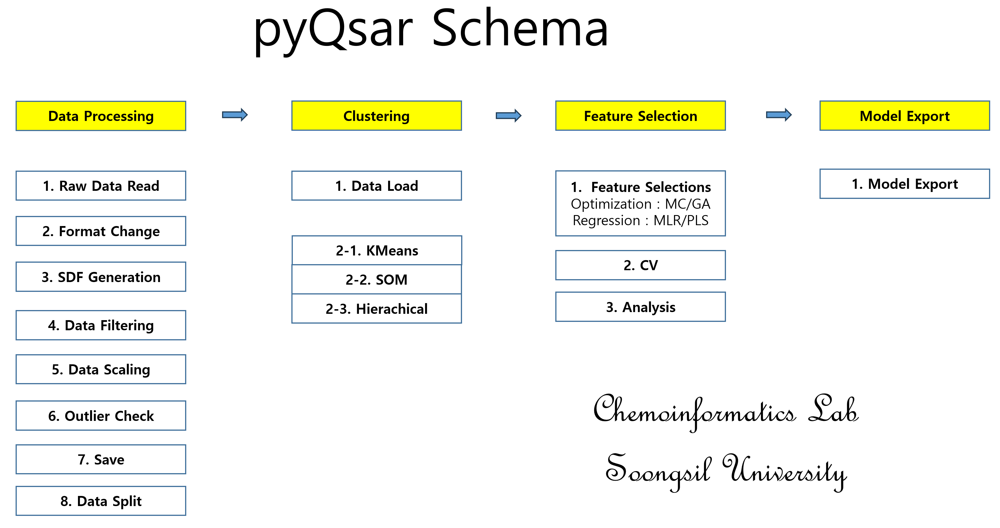

In [4]:
dt.man('Schema.png')

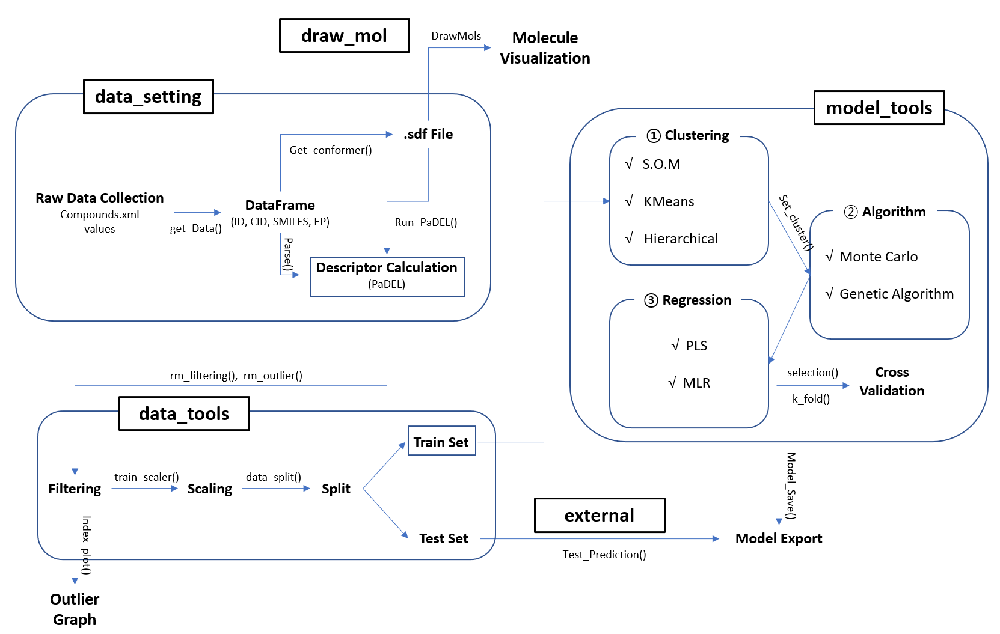

In [5]:
# OLD : 수정이 요구됨
dt.man('workflow.png')

# 1. Data processing
## 1.1. Raw Data Read
### Descriptors from Mordred are recommanded

In [6]:
df = pd.read_csv("qdb.csv") 
df

,Name,Cid,Smiles,logLC50,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,m001,11859,C1=C(C=C(C(=C1Cl)Cl)Cl)O,-5.46,7.427747,7.188678,0,0,11.643052,2.307250,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,m002,11899,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],-4.66,8.134854,7.770338,0,0,12.675204,2.302776,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,m003,2723704,CNC(=S)N,-3.98,3.047207,3.305183,0,0,5.226252,1.847759,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,m004,3032338,CCNC(=S)N,-4.00,3.754314,4.057055,0,0,6.155367,1.902113,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,m005,2346,C1=CC=C(C=C1)CN=C=S,-6.54,7.071068,6.547760,0,0,12.932143,2.154341,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,m288,15292,CC1=CC(=CC(=C1O)Cl)Cl,-5.65,7.427747,7.188678,0,0,11.643052,2.307250,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,m289,15767,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,-7.01,9.496696,9.522267,0,0,15.688761,2.426720,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,m290,1551919,CCCCNC(=S)N,-3.85,5.168527,5.361851,0,0,8.762573,1.949856,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,m291,2566,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,-6.52,12.367162,11.107564,0,0,19.625463,2.470049,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


## 1.2. format change
### pyQsar에서 사용하는 data의 순서 : "ID",  "EP",  "SMI", ~Descriptors~~~~
#### "ID" 는 index, "EP" 는 End Point, "SMI" 는 smiles

In [7]:
# 위 raw data column name의 해당하는 부분을 ID, EP, SMI로 변환 
df = df.rename(columns={'Smiles': 'SMI', 'Cid': 'ID', "logLC50" : "EP"})
df = df[["ID", "EP", "SMI"]+ list(df.columns)[4:]]
df.to_csv("qdb1.csv", index=False)
df

,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],8.134854,7.770338,0,0,12.675204,2.302776,4.605551,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,2723704,-3.98,CNC(=S)N,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3032338,-4.00,CCNC(=S)N,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,1551919,-3.85,CCCCNC(=S)N,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


## 1.3. Generating SDF

In [8]:
dt.generate_sdf(df, 'qdb1.sdf')

          ID    EP                               SMI
0      11859 -5.46          C1=C(C=C(C(=C1Cl)Cl)Cl)O
1      11899 -4.66   C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-]
2    2723704 -3.98                          CNC(=S)N
3    3032338 -4.00                         CCNC(=S)N
4       2346 -6.54               C1=CC=C(C=C1)CN=C=S
..       ...   ...                               ...
287    15292 -5.65             CC1=CC(=CC(=C1O)Cl)Cl
288    15767 -7.01   COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl
289  1551919 -3.85                       CCCCNC(=S)N
290     2566 -6.52  CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C
291    13905 -3.63           CCNC1=NC(=NC(=N1)SC)NCC

[292 rows x 3 columns]


/home/lab00/pyqsar231114/pyqsar/data_tools.py:510: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  smi_df['Molecule'] = smi_df['SMI'].apply(Chem.MolFromSmiles)


## 1.4.  Data Filtering
## eliminating non-numerical data

In [9]:
X_data = df.iloc[:,3:]
X_data

,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,SpAD_A,SpMAD_A,LogEE_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,11.643052,1.164305,3.206363,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,8.134854,7.770338,0,0,12.675204,2.302776,4.605551,12.675204,1.152291,3.294669,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,5.226252,1.045250,2.408576,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,6.155367,1.025895,2.595100,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,12.932143,1.293214,3.179653,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,11.643052,1.164305,3.206363,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,15.688761,1.206828,3.465917,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,8.762573,1.095322,2.887985,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,19.625463,1.226591,3.704782,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


In [10]:
X_data, sel_desc=dt.NonNumricFilter(X_data)

Start :  (292, 1826)
Filterd : (292, 952)


In [11]:
df = df[["ID","EP","SMI"]+sel_desc]
df.to_csv("qdb1_F.csv", index=False)
df

,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,195.924948,15.071150,110,13,48.0,54.0,4.944444,2.222222
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],8.134854,7.770338,0,0,12.675204,2.302776,4.605551,...,9.094144,41.023148,190.954084,13.639577,150,14,52.0,58.0,5.194444,2.472222
2,2723704,-3.98,CNC(=S)N,3.047207,3.305183,0,0,5.226252,1.847759,3.695518,...,6.834109,27.254130,90.025169,8.184106,18,2,16.0,14.0,3.361111,1.333333
3,3032338,-4.00,CCNC(=S)N,3.754314,4.057055,0,0,6.155367,1.902113,3.804226,...,7.131699,29.439488,104.040819,7.431487,32,3,20.0,18.0,3.611111,1.583333
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,7.071068,6.547760,0,0,12.932143,2.154341,4.308683,...,8.438366,38.130322,149.029920,8.766466,133,9,42.0,44.0,3.111111,2.500000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,7.427747,7.188678,0,0,11.643052,2.307250,4.614501,...,9.078065,39.748909,175.979570,10.998723,110,13,48.0,54.0,4.944444,2.222222
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,9.496696,9.522267,0,0,15.688761,2.426720,4.853440,...,9.602855,44.616134,277.862653,17.366416,220,23,64.0,77.0,6.916667,3.000000
289,1551919,-3.85,CCCCNC(=S)N,5.168527,5.361851,0,0,8.762573,1.949856,3.899712,...,7.475906,33.090360,132.072119,6.603606,79,5,28.0,26.0,4.111111,2.083333
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,12.367162,11.107564,0,0,19.625463,2.470049,4.778732,...,9.709599,62.929068,221.105193,7.132426,425,22,84.0,97.0,6.256944,3.472222


## 1.5.  Data scaling
### ScalingTools(scale, ext='.csv')
    * scale : Scaling Method, 'minmax','standard' can be argument
    * ext : call csv format file with ext extension

In [12]:
st = dt.ScalingTools(scale='standard')

Path :/home/lab00/pyqsar231114
Index   File Name
   0    qdb.csv
   1    qdb1.csv
   2    qdb1_F.csv
   3    qdb1_F_s.csv
Enter .csv file index to load : 2




##### train_scaler()
    * fit and transform data
    * save scaler file to use in model information

In [13]:
st.train_scaler()

Scaler File : qdb1_F_standard.info file saved


,ID,EP,SMI,ABC,ABCGG,nAcid,nBase,SpAbs_A,SpMax_A,SpDiam_A,...,SRW10,TSRW10,MW,AMW,WPath,WPol,Zagreb1,Zagreb2,mZagreb1,mZagreb2
0,11859,-5.46,C1=C(C=C(C(=C1Cl)Cl)Cl)O,-0.151062,-0.093948,-0.117851,-0.162791,-0.257506,0.465983,0.541285,...,0.420833,-0.102373,0.159083,0.948995,-0.374862,-0.050123,-0.111334,-0.087220,0.080589,-0.324793
1,11899,-4.66,C1=CC(=C(C=C1Cl)Cl)[N+](=O)[O-],0.008807,0.063539,-0.117851,-0.162791,-0.112802,0.449525,0.524199,...,0.432253,-0.000520,0.102523,0.676300,-0.284085,0.044915,0.016656,0.015890,0.196860,-0.113150
2,2723704,-3.98,CNC(=S)N,-1.141451,-1.145427,-0.117851,-0.162791,-1.157113,-1.223984,-1.213185,...,-1.173080,-1.101110,-1.045867,-0.362894,-0.583651,-1.095539,-1.135254,-1.118326,-0.655795,-1.077300
3,3032338,-4.00,CCNC(=S)N,-0.981582,-0.941853,-0.117851,-0.162791,-1.026855,-1.024075,-1.005646,...,-0.961698,-0.926429,-0.886394,-0.506258,-0.551879,-1.000502,-1.007264,-1.015215,-0.539523,-0.865657
4,2346,-6.54,C1=CC=C(C=C1)CN=C=S,-0.231703,-0.267480,-0.117851,-0.162791,-0.076781,-0.096403,-0.042566,...,-0.033554,-0.231750,-0.374499,-0.251963,-0.322665,-0.430274,-0.303319,-0.344997,-0.772066,-0.089634
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
287,15292,-5.65,CC1=CC(=CC(=C1O)Cl)Cl,-0.151062,-0.093948,-0.117851,-0.162791,-0.257506,0.465983,0.541285,...,0.420833,-0.102373,-0.067860,0.173252,-0.374862,-0.050123,-0.111334,-0.087220,0.080589,-0.324793
288,15767,-7.01,COC1=C(C(=C(C(=C1Cl)Cl)Cl)Cl)Cl,0.316703,0.537885,-0.117851,-0.162791,0.309685,0.905381,0.997454,...,0.793598,0.286676,1.091388,1.386213,-0.125224,0.900256,0.400626,0.505665,0.997839,0.333651
289,1551919,-3.85,CCCCNC(=S)N,-0.661845,-0.588572,-0.117851,-0.162791,-0.661337,-0.848482,-0.823350,...,-0.717203,-0.634606,-0.567448,-0.663959,-0.445215,-0.810426,-0.751284,-0.808994,-0.306981,-0.442372
290,2566,-6.52,CC1(CC2=C(O1)C(=CC=C2)OC(=O)NC)C,0.965682,0.967113,-0.117851,-0.162791,0.861594,1.064743,0.854826,...,0.869420,1.750471,0.445589,-0.563225,0.340012,0.805218,1.040576,1.021218,0.691012,0.733421


## 1.6.  Outlier Check - You can Skip this part!
### 1.6.1. check_outlier(standard) - You can Skip!
    * Check outlier value in data
    * See with histogram, and delete if you want

In [14]:
data = st.check_outlier(9)

interactive(children=(Dropdown(description='Descriptor', options=('nBase', 'VR1_A', 'VR2_A', 'nBridgehead', 'n…

### 1.6.2. dt.outplot(figsize=(2000,2000)) - You can skip!
    * Open File which ext is .out, show histogram of outlier molecule and scatter plot
    * Can Choose File by input index number
    * figsize= (default) (2000,2000) : (weight, height)
    * Return
        output, dictionary type data
        
    ** To import image about outlier index plot, requires the kaleido package : pip install -U kaleido

In [15]:
st.outplot()

/home/lab00/pyqsar231114
File Index   File Name
0            qdb1_F_standard_9.out
Enter File Index Num of Above List : 0
qdb1_F_standard_9.out is selected


interactive(children=(Dropdown(description='ID:', options=('11712', '12358480', '1269845', '12901', '13218779'…

### 1.7. Save Scaled Data

In [16]:
st.save()

File name to save scaling as
(default) qdb1_F_s.csv

-
qdb1_F_s.csv is saved




### 1.8. Data Split

##### data_split(total_frame, test_num)
    * total_frame : filter, scaling data file
    * test_num : split # sample 

In [17]:
# 데이터를 Train / Validation 으로 나누는 단계
dt.data_split_random('.csv',test_num=98)
#dt.data_split_block('.csv',test_num=98)  # Not Yet implimented


Path :/home/lab00/pyqsar231114
Index   File Name
   0    qdb.csv
   1    qdb1.csv
   2    qdb1_F.csv
   3    qdb1_F_s.csv
Enter .csv file index to load : 3


try   1
['NaasN', 'NdssS', 'SaasN', 'SdssS', 'n7Ring', 'n7HRing', 'n7ARing', 'n6AHRing', 'n7AHRing', 'n11FRing', 'n12FRing', 'n11FHRing', 'n12FHRing', 'n11FARing', 'n12FARing', 'n11FAHRing', 'n12FAHRing']
--------------------
try   2
['nI', 'C2SP1', 'NaaO', 'NsI', 'SaaO', 'SsI', 'n7FRing', 'n8FRing', 'n8FHRing', 'nG12FaHRing', 'n7FARing', 'n8FARing', 'n8FAHRing']
--------------------
try   3
train :  (194, 955)
qdb1_F_s.train  is saved.
test :  (98, 955)
qdb1_F_s.test   is saved.


## 2. Clustering
----------------------
### 2.1. Data Load
    * Split data by [descriptor, EP] set from train/test file

In [18]:
# Train 데이터를 Descriptor에 해당하는 부분과 EP에 해당하는 값으로 나누는 단계
X_train, y_train = mt.split_xy('.train')

Path :/home/lab00/pyqsar231114
Index   File Name
   0    qdb1_F_s.train
Enter .train file index to load : 0




### 2.2.1. KMeans
#### mt.FeatureCluster_KMeans(train_Data, K value=500, init='k-means++', algorithm='auto') : Apply KMeans Class
    * qstart = saved file name of clust info
    * K value = # cluster (default) 500
    * init = mthod of finding centroid 
        Possible : (default)'k-means++', 'random' = select centroid randomly in rows
    * algorithm
        Possible : (default)'auto', 'elkan', 'full'
            full : classical EM(expectaion maximization) algorithm => appropriate sparse data
            elkan : appropriate dense data
            auto : automatically select according to the data, usually choose elkan
    clust = fit KMeans(train_data, K) Model 
    set_cluster = get cluster value as array
    cluster_dist = clust evaluation by histogram
    model_evaluation = clust evaluation by silhouette score
         0 : cluster overlapped
         1 : clustering well
        -1 : clustering bad

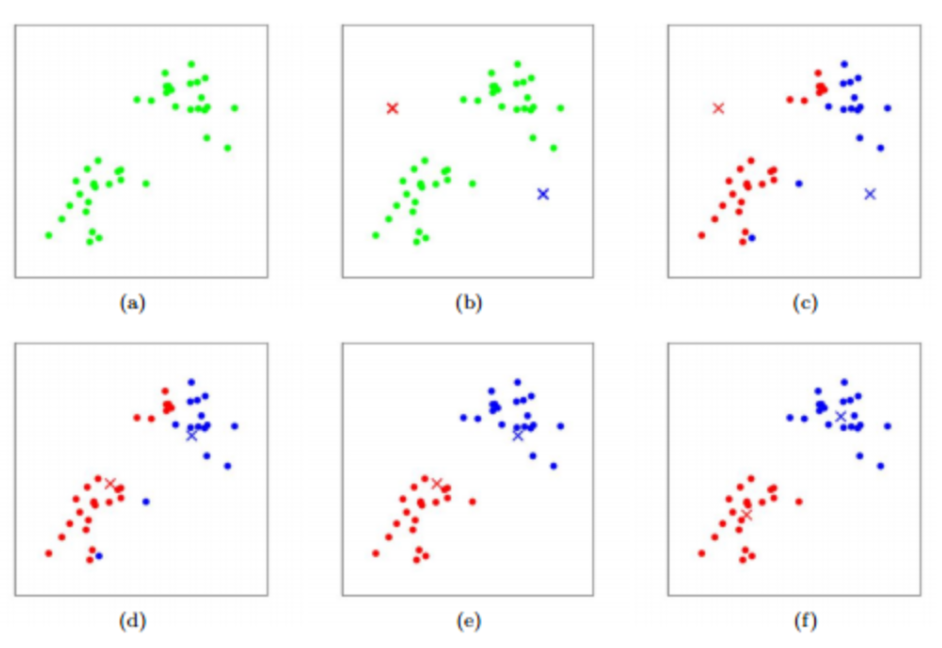

In [24]:
dt.man('kmeans.png')

In [19]:
# KMeans Clustering 단계
clust = mt.FeatureCluster_KMeans(X_train,400,init='k-means++',algorithm='auto')
clust_info = clust.set_cluster()

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f8b610119d0>
Traceback (most recent call last):
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'
Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x

Exception ignored on calling ctypes callback function: <function _ThreadpoolInfo._find_modules_with_dl_iterate_phdr.<locals>.match_module_callback at 0x7f8b610119d0>
Traceback (most recent call last):
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 400, in match_module_callback
    self._make_module_from_path(filepath)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 515, in _make_module_from_path
    module = module_class(filepath, prefix, user_api, internal_api)
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 606, in __init__
    self.version = self.get_version()
  File "/share/anaconda3/lib/python3.9/site-packages/threadpoolctl.py", line 646, in get_version
    config = get_config().split()
AttributeError: 'NoneType' object has no attribute 'split'



 Cluster 0 ['ATSC5s'] 
 Cluster 1 ['SpAbs_A', 'SpAD_A', 'nHeavyAtom', 'ATS0d', 'VR1_DzZ', 'VR1_Dzm', 'VR1_Dzv', 'VR1_Dzse', 'VR1_Dzpe', 'VR1_Dzare', 'VR1_Dzp', 'VR1_Dzi', 'BertzCT', 'nBondsO', 'Xp-0d', 'Xp-1d', 'Xp-2d', 'VR1_D', 'ETA_beta_s', 'ETA_eta_R', 'ETA_eta_RL', 'MID', 'MWC01', 'Zagreb1', 'mZagreb2'] 
 Cluster 2 ['GATS1s'] 
 Cluster 3 ['NdO', 'SdO', 'VSA_EState2'] 
 Cluster 4 ['C2SP2', 'SMR_VSA7'] 
 Cluster 5 ['ATS0se', 'ATS0pe', 'ATS0are', 'TIC0', 'TIC1', 'Kier1'] 
 Cluster 6 ['NssCH2', 'SssCH2'] 
 Cluster 7 ['nCl', 'nX', 'NsCl', 'SsCl', 'EState_VSA9', 'MID_X'] 
 Cluster 8 ['VR1_A', 'VR2_A'] 
 Cluster 9 ['nAHRing'] 
 Cluster 10 ['AXp-1d'] 
 Cluster 11 ['Xpc-4d', 'GGI2'] 
 Cluster 12 ['NdssS', 'n7Ring', 'n7HRing', 'n7ARing', 'n7AHRing', 'n12FRing', 'n12FHRing', 'n12FARing', 'n12FAHRing'] 
 Cluster 13 ['ETA_epsilon_2', 'ETA_epsilon_5'] 
 Cluster 14 ['MATS2Z', 'MATS2m'] 
 Cluster 15 ['VE1_DzZ', 'VR2_DzZ', 'VE1_Dzm', 'VR2_Dzm', 'VE1_Dzv', 'VR2_Dzv', 'VE1_Dzse', 'VR2_Dzse', 'VE1_Dz

 Cluster 267 ['GATS2c'] 
 Cluster 268 ['IC0'] 
 Cluster 269 ['ATS0v', 'ATS1v', 'ATS1p', 'Xp-0dv', 'Sv', 'Sp', 'ETA_alpha', 'VMcGowan', 'LabuteASA', 'apol', 'SMR'] 
 Cluster 270 ['GATS2s'] 
 Cluster 271 ['AATSC0v'] 
 Cluster 272 ['nHBAcc', 'TopoPSA'] 
 Cluster 273 ['AETA_eta'] 
 Cluster 274 ['nG12FRing'] 
 Cluster 275 ['n9FARing', 'n9FAHRing'] 
 Cluster 276 ['C3SP2'] 
 Cluster 277 ['BCUTc-1l'] 
 Cluster 278 ['ATSC6v', 'ATSC6p'] 
 Cluster 279 ['C1SP3'] 
 Cluster 280 ['VSA_EState9'] 
 Cluster 281 ['ATSC3s'] 
 Cluster 282 ['SIC1', 'BIC1'] 
 Cluster 283 ['GATS1c'] 
 Cluster 284 ['SlogP_VSA8'] 
 Cluster 285 ['ATSC4dv'] 
 Cluster 286 ['JGI9'] 
 Cluster 287 ['ATSC1d'] 
 Cluster 288 ['ATS4Z', 'ATS4m'] 
 Cluster 289 ['nBondsD'] 
 Cluster 290 ['RotRatio'] 
 Cluster 291 ['BCUTv-1h', 'BCUTp-1h'] 
 Cluster 292 ['AETA_beta_s'] 
 Cluster 293 ['ETA_shape_y'] 
 Cluster 294 ['SpAbs_Dzv', 'SpMax_Dzv', 'SpDiam_Dzv', 'SpAD_Dzv', 'LogEE_Dzv', 'SpAbs_Dzp', 'SpMax_Dzp', 'SpDiam_Dzp', 'SpAD_Dzp', 'LogEE_Dzp'] 


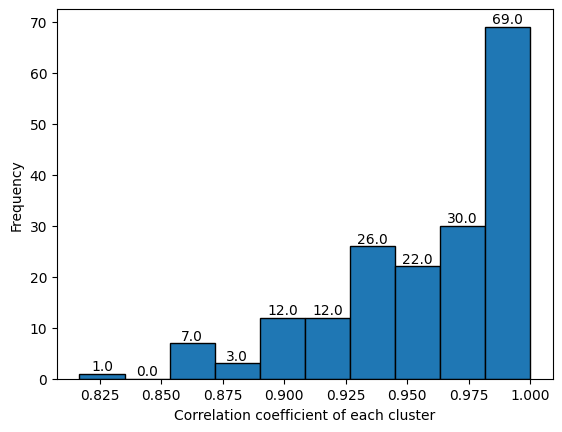

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 2, 3, 4, 5, 6, 7, 8, 9), value=0), O…

In [20]:
# Cluster의 내부 거리를 통한 평가 지표
clust.cluster_dist()

silhouette average score : 0.587011
silhouette socre group by 
 Cluster
0      0.000000
1      0.662284
2      0.000000
3      0.657596
4      0.622315
         ...   
395    0.000000
396    0.691496
397    0.000000
398    0.476911
399    0.867129
Name: silhouette_coeff, Length: 400, dtype: float64


overlapped Cluseter Num :  [0, 2, 9, 10, 22, 23, 26, 27, 28, 46, 53, 64, 68, 70, 72, 84, 86, 87, 93, 94, 98, 100, 103, 113, 115, 117, 121, 127, 129, 131, 136, 137, 138, 140, 142, 143, 144, 146, 148, 149, 150, 151, 153, 154, 155, 156, 157, 158, 160, 161, 162, 164, 165, 166, 167, 168, 170, 172, 175, 177, 180, 181, 182, 183, 185, 186, 188, 189, 190, 191, 192, 193, 197, 198, 199, 202, 204, 206, 207, 208, 209, 210, 216, 217, 218, 220, 221, 224, 225, 226, 227, 230, 231, 232, 233, 235, 236, 237, 240, 241, 242, 245, 247, 250, 251, 252, 254, 255, 257, 259, 260, 261, 262, 263, 264, 265, 266, 267, 268, 270, 271, 273, 274, 276, 277, 279, 280, 281, 283, 284, 285, 286, 287, 289, 290, 292, 293, 298, 299,

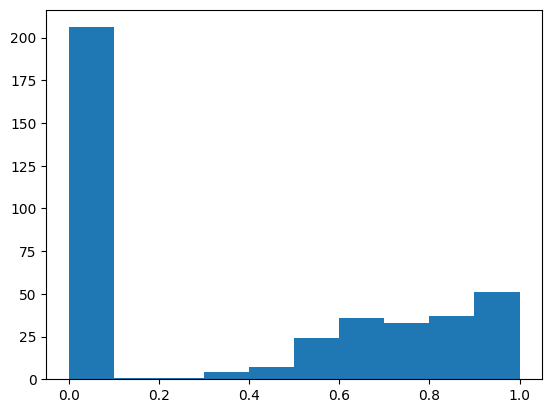

In [21]:
### 의미? 저장은 언제? 어떤이름으로 save 됐다 표시
## 화일명 없으면 메모리 아니면 불러오기?
clust.model_evaluation()

## Silhouette Score에 계산에 해당하는 Nearest Cluster 확인하는 방법 찾아볼 것. (아직 진행하지 못함)

### 2.2.2. S.O.M
### 주의 : 시간이 많이 걸림 
#### mt.FeatureCluster_Minisom(train_data, error, random_seed, train,neighborhood_function, topology) : Apply S.O.M Class
    * data = Train Data
    * Error = (default) qe, te
    * random_seed = (default) 0
    * train = time to init, (default) 1000
    * neighborhood_function = function weight neightborhookd of a position in mpa
        Possible : (default) 'gaussian', 'mexican_hat', 'bubble', 'triangle'
    * topology = (default) 'hexagonal', 'rectangular'
        - Error te can't use hexagonal topology
    
    Parameter_Combine(min_size,max_size) = expect #cluster n x n in range(min_size to max_size)
    
    set_cluster(map_n,sigma,lr,init) = get cluster value as array
        * map_n : map size
        * sigma
        * lr : initial learning_rate
        * init : metohd of initai weight
            Possible : 'pca', 'random'

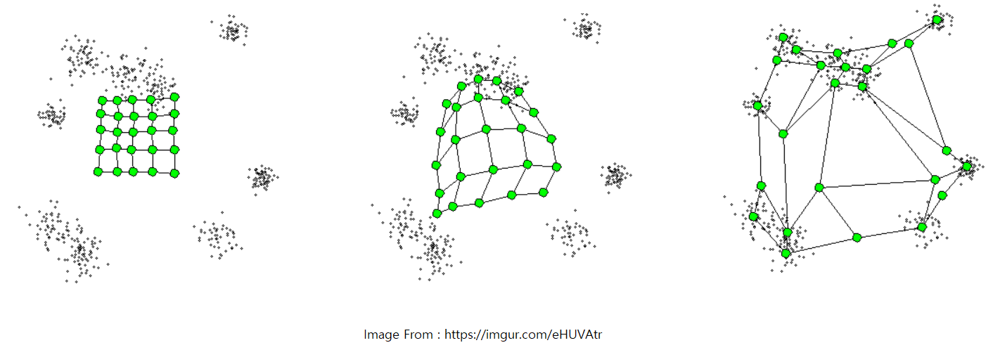

In [29]:
dt.man('som.png')

In [22]:
# S.O.M의 경우 args에 따라서 cluster의 개수가 다양하기 때문에, 해당 부분을 미리 확인해보는 단계
clust = mt.FeatureCluster_Minisom(X_train)
clust.parameter_combine(18,19)


시작시간: 2023-11-16 09:29:03.204136 



/home/lab00/pyqsar231114/pyqsar/minisom.py:477: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)



종료시간: 2023-11-16 09:30:05.750898 
총 소요시간: 0 days 00:01:02.546762


,map_size,sigma,learning_rate,init_method,qe,n_cluster
0,18x18,0.1,0.8,random_init,3.473806,312
1,18x18,0.2,0.8,random_init,3.473807,312
2,18x18,0.3,0.8,random_init,3.474646,310
3,18x18,0.1,0.7,random_init,3.485364,309
4,18x18,0.2,0.7,random_init,3.485364,309
...,...,...,...,...,...,...
175,18x18,0.5,0.1,random_init,9.212172,27
176,18x18,0.4,0.1,random_init,9.304980,27
177,18x18,0.3,0.1,random_init,9.338804,28
178,18x18,0.2,0.1,random_init,9.338823,28


/home/lab00/pyqsar231114/pyqsar/minisom.py:477: RuntimeWarning: invalid value encountered in sqrt
  return sqrt(-2 * cross_term + input_data_sq + weights_flat_sq.T)


Quantization Error : 3.4888934067075295

 Cluster 0 ['JGI2', 'JGT10'] 
 Cluster 1 ['JGI7'] 
 Cluster 2 ['AATSC0c'] 
 Cluster 3 ['ATS7s', 'ATS8s'] 
 Cluster 4 ['VE3_A'] 
 Cluster 5 ['SpAbs_D', 'SpMax_D', 'SpDiam_D', 'SpAD_D', 'LogEE_D'] 
 Cluster 6 ['NaaNH'] 
 Cluster 7 ['MIC5'] 
 Cluster 8 ['ATSC3i'] 
 Cluster 9 ['NaaO', 'SaaO'] 
 Cluster 10 ['ATS3se', 'ATS3pe'] 
 Cluster 11 ['GATS1s', 'GATS1se', 'GATS1pe', 'GATS1are'] 
 Cluster 12 ['AATSC2dv', 'MATS2dv'] 
 Cluster 13 ['nN', 'BCUTi-1h', 'SMR_VSA3', 'MID_N', 'AMID_N'] 
 Cluster 14 ['ATSC1d'] 
 Cluster 15 ['ATS4se', 'ATS4pe', 'ATS4are'] 
 Cluster 16 ['MIC2'] 
 Cluster 17 ['GGI4'] 
 Cluster 18 ['C1SP3', 'NsCH3', 'SsCH3', 'SMR_VSA5', 'SlogP_VSA5', 'VSA_EState8'] 
 Cluster 19 ['BalabanJ'] 
 Cluster 20 ['SpMAD_Dzv', 'SpAbs_Dzp', 'SpMax_Dzp', 'SpDiam_Dzp', 'SpAD_Dzp', 'SpMAD_Dzp', 'LogEE_Dzp'] 
 Cluster 21 ['ATSC4Z', 'ATSC4m', 'ATSC4v', 'ATSC4p', 'ATSC4i'] 
 Cluster 22 ['ATSC4c', 'ATSC4dv', 'ATSC4s', 'ATSC4se', 'ATSC4pe', 'ATSC4are', 'SM1_Dzv

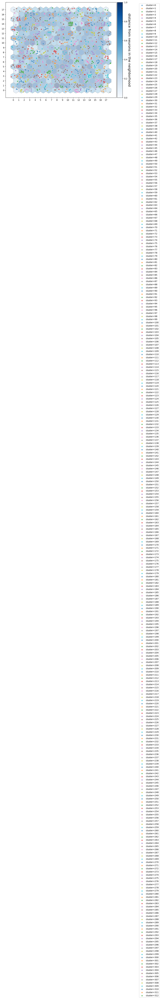

In [23]:
# SOM Clustering 단계
clust_info = clust.set_cluster(map_n=18,sigma=0.1,lr=0.9,init='random')


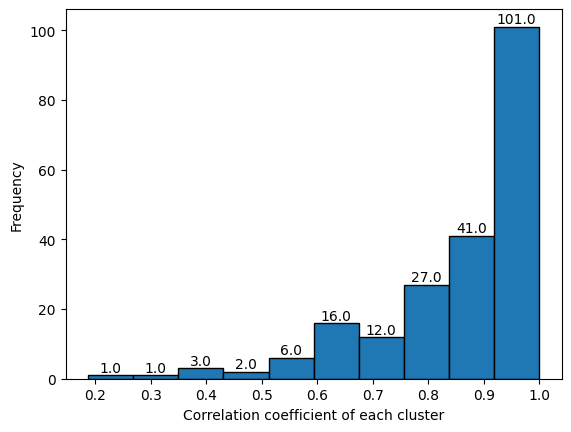

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 1, 2, 3, 4, 5, 6, 7, 8, 9), value=0)…

In [24]:
clust.cluster_dist()

# Cluster의 내부 거리를 통한 평가 지표

### 2.2.3. Hierarchical
#### mt.FeatureCluster(X_data, method, depth) : Apply S.O.M Class
    *method = linkage method
        Possible values = 'average','complete','single'
    *depth = Standard cut branch
    
    cluster_dist = clust evaluation by histogram
    set_cluster() : get cluster value as array
    

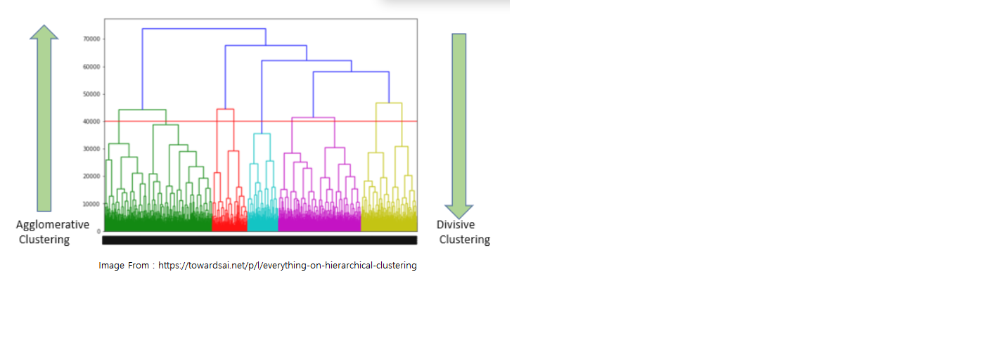

In [25]:
dt.man('hierarchical.png')

In [26]:
# Cophenet의 값을 통해서 Clustering 방식 선택
clust = mt.FeatureCluster(X_train)
clust.cophenetic()

average linkage cophenet: 0.8390982103082782
complete linkage cophenet: 0.8167465533071638
single linkage cophenet: 0.3833900529071659


In [27]:
clust_info = clust.set_cluster('complete',1)

# Hierarchical Clustering 단계


 Cluster 0 ['nFRing'] 
 Cluster 1 ['nFHRing'] 
 Cluster 2 ['nHRing'] 
 Cluster 3 ['nAHRing'] 
 Cluster 4 ['Xch-3dv', 'n3Ring', 'n3ARing', 'SRW03'] 
 Cluster 5 ['n3HRing', 'n3AHRing'] 
 Cluster 6 ['Xch-3d'] 
 Cluster 7 ['n5Ring', 'n5ARing'] 
 Cluster 8 ['nARing'] 
 Cluster 9 ['nBridgehead'] 
 Cluster 10 ['SRW05', 'SRW07', 'SRW09'] 
 Cluster 11 ['nFARing', 'nFAHRing'] 
 Cluster 12 ['ATSC3Z', 'ATSC3m'] 
 Cluster 13 ['nG12FHRing', 'nG12FARing', 'nG12FAHRing'] 
 Cluster 14 ['nG12FRing'] 
 Cluster 15 ['AETA_eta_BR'] 
 Cluster 16 ['JGT10'] 
 Cluster 17 ['Xc-4d'] 
 Cluster 18 ['ETA_shape_x'] 
 Cluster 19 ['Xc-6d'] 
 Cluster 20 ['Xc-5dv'] 
 Cluster 21 ['NssssC'] 
 Cluster 22 ['SssssC'] 
 Cluster 23 ['nX', 'MID_X'] 
 Cluster 24 ['nCl', 'NsCl', 'SsCl'] 
 Cluster 25 ['EState_VSA9'] 
 Cluster 26 ['Xc-4dv'] 
 Cluster 27 ['Xc-6dv'] 
 Cluster 28 ['ATSC5se'] 
 Cluster 29 ['ATSC5pe'] 
 Cluster 30 ['ATSC5are'] 
 Cluster 31 ['ATSC8se', 'ATSC8pe', 'ATSC8are'] 
 Cluster 32 ['ATSC8dv'] 
 Cluster 33 ['ATSC8s

 Cluster 243 ['n9FARing', 'n9FAHRing'] 
 Cluster 244 ['n8FRing', 'n8FHRing', 'n8FARing', 'n8FAHRing'] 
 Cluster 245 ['n5HRing'] 
 Cluster 246 ['n5AHRing'] 
 Cluster 247 ['NaaaC', 'SaaaC', 'nFaRing'] 
 Cluster 248 ['nG12FaRing'] 
 Cluster 249 ['BCUTd-1l'] 
 Cluster 250 ['EState_VSA8'] 
 Cluster 251 ['n6HRing', 'n6aHRing'] 
 Cluster 252 ['naHRing'] 
 Cluster 253 ['NaasN', 'SaasN'] 
 Cluster 254 ['n6ARing'] 
 Cluster 255 ['n6AHRing'] 
 Cluster 256 ['ATSC5c'] 
 Cluster 257 ['VSA_EState5'] 
 Cluster 258 ['NaaN', 'SaaN'] 
 Cluster 259 ['ATSC3c'] 
 Cluster 260 ['ATSC6dv'] 
 Cluster 261 ['NsOH', 'SsOH'] 
 Cluster 262 ['nHBDon'] 
 Cluster 263 ['NsNH2', 'SsNH2'] 
 Cluster 264 ['VSA_EState4'] 
 Cluster 265 ['ATSC1p'] 
 Cluster 266 ['ATSC4i'] 
 Cluster 267 ['AETA_eta_L'] 
 Cluster 268 ['AETA_eta_FL'] 
 Cluster 269 ['FCSP3'] 
 Cluster 270 ['AETA_beta_ns'] 
 Cluster 271 ['AETA_dBeta'] 
 Cluster 272 ['AATSC1v'] 
 Cluster 273 ['GATS1i'] 
 Cluster 274 ['AATS2i'] 
 Cluster 275 ['AETA_beta'] 
 Cluster 27

 Cluster 537 ['Xp-2dv'] 
 Cluster 538 ['nC', 'MID_C'] 
 Cluster 539 ['VR2_DzZ', 'VR2_Dzm', 'VR2_Dzv', 'VR2_Dzse', 'VR2_Dzpe', 'VR2_Dzare', 'VR2_Dzp', 'VR2_Dzi', 'VR2_D', 'TMWC10'] 
 Cluster 540 ['VR3_A', 'VE1_DzZ', 'VE1_Dzm', 'VE1_Dzv', 'VE1_Dzse', 'VE1_Dzpe', 'VE1_Dzare', 'VE1_Dzp', 'VE1_Dzi', 'VE1_D'] 
 Cluster 541 ['VR1_DzZ', 'VR1_Dzm', 'VR1_Dzv', 'VR1_Dzse', 'VR1_Dzpe', 'VR1_Dzare', 'VR1_Dzp', 'VR1_Dzi', 'VR1_D'] 
 Cluster 542 ['ABC', 'SpAbs_A', 'SpAD_A', 'nHeavyAtom', 'nBondsO', 'Xp-1d', 'ETA_eta_RL', 'MID', 'MWC01'] 
 Cluster 543 ['Xp-0d', 'ETA_eta_R'] 
 Cluster 544 ['ABCGG', 'Xp-2d', 'ETA_beta_s'] 
 Cluster 545 ['ATS0d', 'ATS1d'] 
 Cluster 546 ['Zagreb1'] 
 Cluster 547 ['ATS2v', 'ATS3v'] 
 Cluster 548 ['ATS2d', 'ATS3d'] 
 Cluster 549 ['ATS4v'] 
 Cluster 550 ['ATS4p'] 
 Cluster 551 ['ATS0v', 'SMR'] 
 Cluster 552 ['VMcGowan'] 
 Cluster 553 ['ATS1p', 'Sp', 'apol'] 
 Cluster 554 ['ATS1v'] 
 Cluster 555 ['Sv'] 
 Cluster 556 ['SZ', 'Sm', 'MW'] 
 Cluster 557 ['ZMIC0'] 
 Cluster 558 ['A

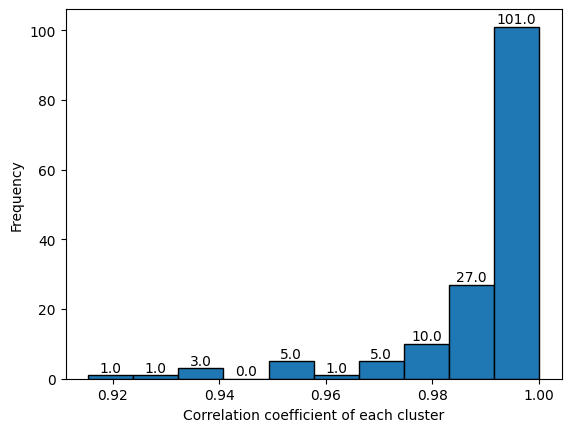

interactive(children=(ToggleButtons(description='Bins Index', options=(0, 1, 2, 4, 5, 6, 7, 8, 9), value=0), O…

In [28]:
# Cluster의 내부 거리를 통한 평가 지표
clust.cluster_dist()

## 3. Feature Selection
----------------------
### 3.1. Monte Carlo
    selection(X_train, y_train, clust_info, model, pop_info, learning, bank, component, pntinterval)
    X_train : Descriptor Data
    y_train : end point
    clust_info : clustering informatino after clustering
    model : model algorithm
        Possible : 'PLS', 'MLR'
    pop_info
        None = start with empty
        population = used previous data continuously
    learning : # learning
    bank : # bank
    component : # descriptor
    pntiniterval : print value interval
    
    * return
        - select : selected feature
        - population : save point to restart

#### 3.1.1 Monte Carlo Feature Selection

In [29]:
descriptor = 4
model_algo='MLR'
N_learning = 100
N_bank = 200
N_component = descriptor
select, population = mt.selection_mc(X_train,y_train,model=model_algo,
                                     pop_info=None,
                                     #pop_info=population,
                                     learning=N_learning,
                                     bank=N_bank,
                                     component=N_component,
                                     pntinterval=20 )

# MC을 이용한 Feature Selection 단계

Start time :  09:31:30
Index   File Name
0       qdb1_F_s_kmeans.cluster
1       qdb1_F_s_hierarchical.cluster
2       qdb1_F_s_som.cluster


Enter Clust Info File Index : 0
qdb1_F_s_kmeans.cluster    file selected

MLR
                       R^2                  RMSE


  0%|          | 0/100 [00:00<?, ?it/s]

20 => 09:31:42 [0.6781643534975452, 0.9601151288734986, ['ATS0p', 'BIC1', 'MATS2pe', 'SlogP_VSA2']]
40 => 09:31:47 [0.7001710455378976, 0.9267082424735058, ['ATS0p', 'MID_C', 'SlogP_VSA11', 'SlogP_VSA2']]
60 => 09:31:51 [0.7001710455378976, 0.9267082424735058, ['ATS0p', 'MID_C', 'SlogP_VSA11', 'SlogP_VSA2']]
80 => 09:31:56 [0.7014654578489271, 0.9247057006923686, ['ATS0p', 'ATS5s', 'SlogP_VSA2', 'nHBAcc']]
100 => 09:32:01 [0.7014654578489271, 0.9247057006923686, ['ATS0p', 'ATS5s', 'SlogP_VSA2', 'nHBAcc']]
R2       : 0.701465
RMSE     : 0.924706
Cluster  : ['ATS0p', 'ATS5s', 'SlogP_VSA2', 'nHBAcc']
[0.7014654578489271, 0.9247057006923686, ['ATS0p', 'ATS5s', 'SlogP_VSA2', 'nHBAcc']]
Model's cluster info [176, 297, 162, 272]
qdb1_F_s_mc_MLR_kmeans.log  is saved!


#### 3.1.2. Epoch Graph

Index   File Name
0       qdb1_F_s_mc_MLR_kmeans.log
1       qdb1_F_s_mc_MLR_hierarchical.log


Enter Clust Info File Index : 0
qdb1_F_s_mc_MLR_kmeans.log    file selected



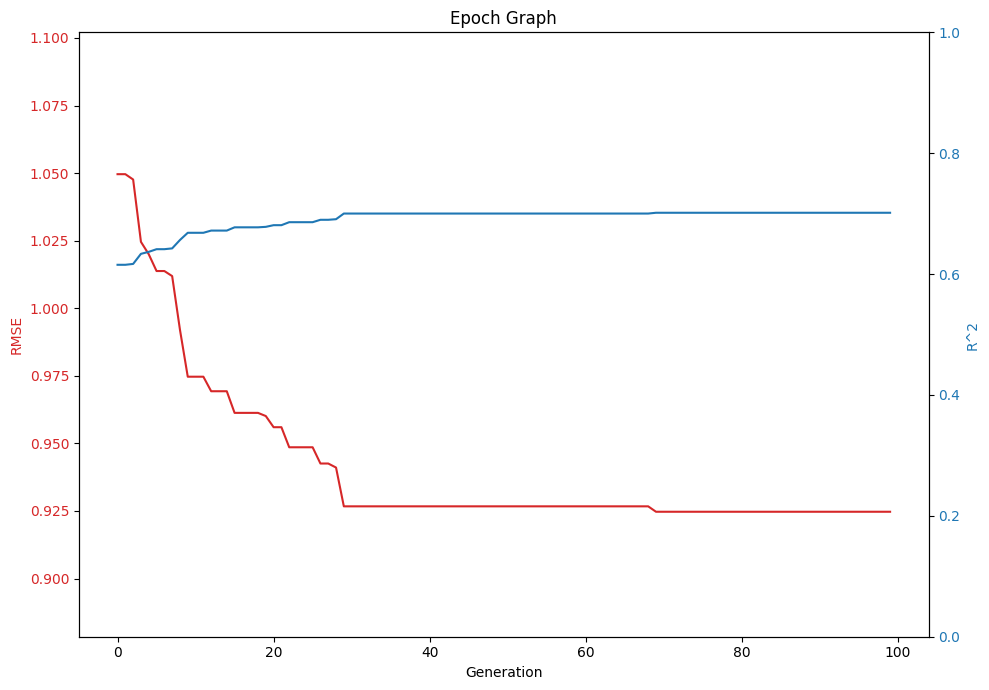

In [30]:
# MC/GA에서 얻은 log에서 RMSE와 R2의 변화를 보는 단계
mt.Draw_epoch()

#### 3.1.3. Model Information and Save

In [31]:
model = mt.GetModel(select,model_algo,n_component=descriptor)

Path :/home/lab00/pyqsar231114
Index   File Name
   0    qdb1_F_s.train
Enter .train file index to load : 0




In [32]:
model.train_plot()

# Feature Selection에서 얻은 Descriptor을 이용하여 Train 하는 단계

Loading BokehJS ...

,ATS0p,ATS5s,SlogP_VSA2,nHBAcc
Coef Value,-1.535184,0.430949,0.726094,-0.535486


In [33]:
# Cross Validation을 통해서 Train Model에 대한 평가 지표 만드는 단계
model.k_fold()

sklearn R^2CV mean: 0.702504
sklearn Q^2CV mean: 0.694429
RMSE CV : 0.938655
Features set = ['ATS0p', 'ATS5s', 'SlogP_VSA2', 'nHBAcc']


In [34]:
# Descriptor에 대한 정보, EP/Predict/Error에 대한 정보
model.features_table()

,ATS0p,ATS5s,SlogP_VSA2,nHBAcc,EP,Predict,Error
ID,,,,,,,
11859,-0.144501,-0.689639,-0.521548,-0.478097,-5.46,-4.872530,-0.587470
11899,-0.311632,-0.265913,-0.537675,0.098780,-4.66,-4.753969,0.093969
2723704,-0.945347,-0.776580,0.099304,-0.478097,-3.98,-3.229754,-0.750246
3032338,-0.733313,-0.606109,0.055038,-0.478097,-4.00,-3.513943,-0.486057
2346,-0.024834,-0.417462,-0.516730,0.098780,-6.54,-5.244359,-1.295641
...,...,...,...,...,...,...,...
15910,0.476543,-0.122030,-0.971021,0.098780,-6.21,-6.216606,0.006606
15292,-0.180799,-0.527286,-0.521548,-0.478097,-5.65,-4.746840,-0.903160
15767,0.564199,-0.499067,-0.345221,-0.478097,-7.01,-5.750358,-1.259642


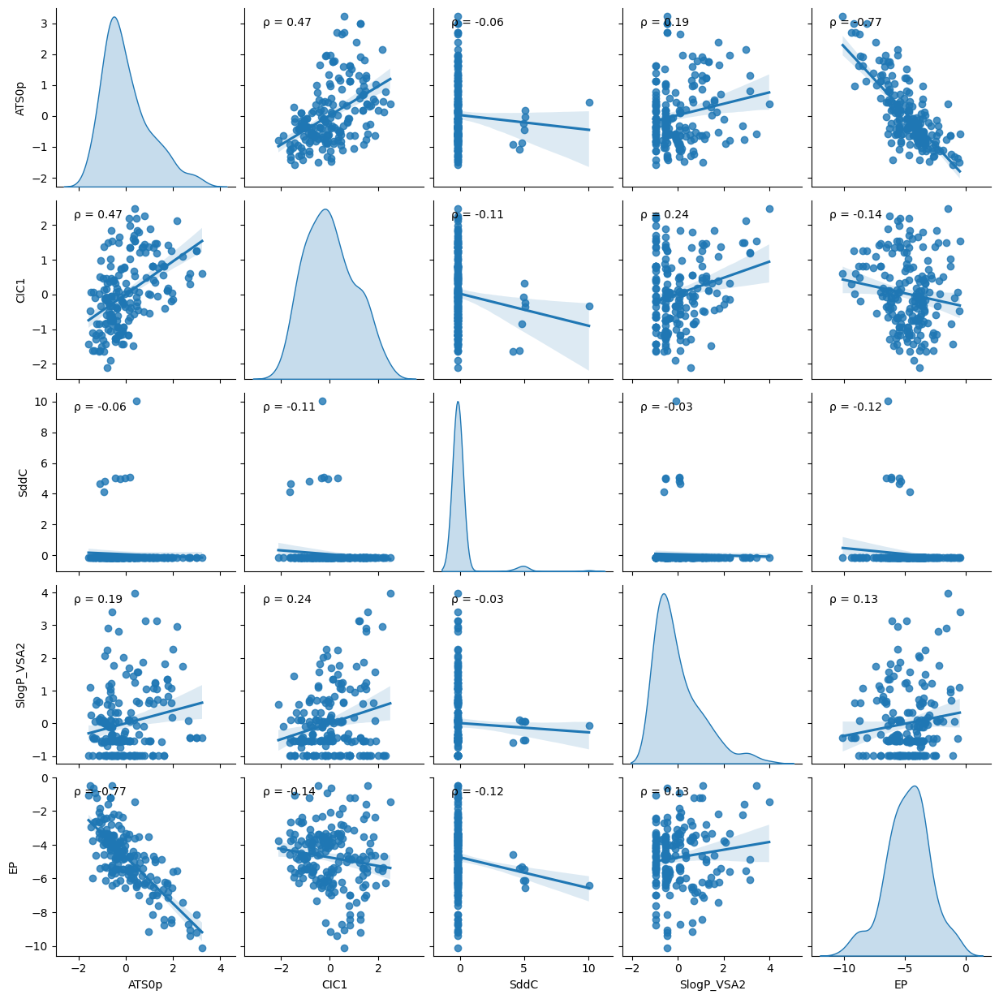

,ATS0p,CIC1,SddC,SlogP_VSA2,EP
ATS0p,1.000000,0.474839,-0.056041,0.189596,-0.765744
CIC1,0.474839,1.000000,-0.108642,0.238843,-0.140024
SddC,-0.056041,-0.108642,1.000000,-0.032414,-0.118603
SlogP_VSA2,0.189596,0.238843,-0.032414,1.000000,0.131138
EP,-0.765744,-0.140024,-0.118603,0.131138,1.000000


In [38]:
# 각 Descriptor와 EP의 Correlation을 보는 단계
model.feature_corr()

In [35]:
# Scaling 단계에서 얻은 Scaler을 불러와 해당 정보를 저장하는 과정.
model.save()

Path :/home/lab00/pyqsar231114
Index   File Name
   0    qdb1_F_standard.info
Enter .info file index to load : 0


Selected Algorithm in Feature Selection (MC/GA) : MC
Selected Model (MLR/PLS) : MLR
Enter model name to  save as
(default) qdb1_F_s_MC_MLR.model
- : 
qdb1_F_s_MC_MLR.model file saved


Path :/home/lab00/pyqsar231114
Index   File Name
   0    output.sdf
   1    output2.sdf
   2    qdb1.sdf
Enter .sdf file index to load : 2




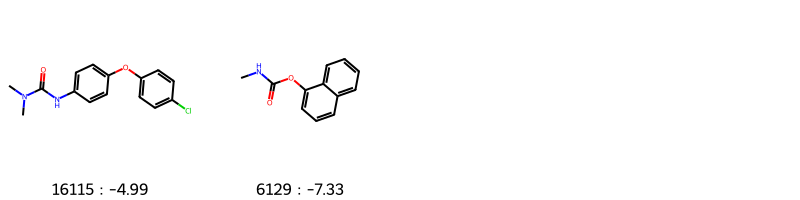

In [41]:
# train_plot 단계에서 Error가 높은 분자를 2D Image로 보는 단계
mol = draw_mol.DrawMols(ID=['16115','6129'])
mol.show()

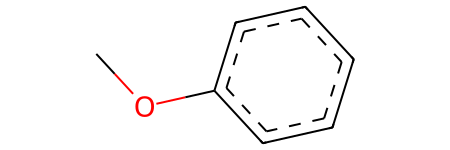

In [42]:
# 선택한 분자들의 공통 부분을 확인하는 단계
substr = mol.common_substr()
mol.show_substr(substr)

In [63]:
# 선택한 분자들을 3D Image로 보는 단계
mol.show_3D()

interactive(children=(Dropdown(description='ID', options=('10351-06-1', '142-08-5', '500-22-1'), value='10351-…

### Genetic Algorithm
    selection(X_train, y_train, clust_info, clustering, model, pop_info, n_pop_size, N_generation, component)
    X_train : Descriptor Data
    y_train : end point
    clust_info : clustering informatino after clustering
    clustering : method of clustering
        Possible : 'hierarchical', 'kmeans', 'som'
    model : model algorithm
        Possible : 'PLS', 'MLR'
    pop_info
        None = start with empty
        population = used previous data continuously
    N_generation : # learning
    n_pop_size : # bank
    component : # descriptor

In [36]:
descriptor = 4
model_algo='PLS'
N_learning = 10
N_bank = 200
N_component = descriptor
select, population = mt.selection_ga(X_train,y_train,model=model_algo,
                                     pop_info=None,
                                     #pop_info=population,
                                     n_pop_size=N_bank,
                                     N_generation=N_learning,
                                     component=N_component,
                                    )

PLS
Index   File Name
0       4-training_p_f_s_kmeans.cluster


Enter Clust Info File Index : 0
4-training_p_f_s_kmeans.cluster    file selected

---------------  Initialization  ---------------


  0%|          | 0/10 [00:00<?, ?it/s]

RMSE        R2          Portion 
0.414476    0.703579    1.548364% 
---------------  1 Generation  ---------------
RMSE        R2          Portion 
0.406523    0.714845    1.239129% 
---------------  2 Generation  ---------------
RMSE        R2          Portion 
0.392221    0.734556    1.188198% 
---------------  3 Generation  ---------------
RMSE        R2          Portion 
0.392221    0.734556    1.016575% 
---------------  4 Generation  ---------------
RMSE        R2          Portion 
0.392221    0.734556    0.854536% 
---------------  5 Generation  ---------------
RMSE        R2          Portion 
0.392221    0.734556    0.762674% 
---------------  6 Generation  ---------------
RMSE        R2          Portion 
0.378144    0.753269    0.825962% 
---------------  7 Generation  ---------------
RMSE        R2          Portion 
0.378144    0.753269    0.808531% 
---------------  8 Generation  ---------------
RMSE        R2          Portion 
0.378144    0.753269    0.735569% 
------------

#### Epoch Graph

Index   File Name
0       4-training_p_f_s_mc_MLR_kmeans.log
1       4-training_p_f_s_ga_PLS_kmeans.log


Enter Clust Info File Index : 1
4-training_p_f_s_ga_PLS_kmeans.log    file selected



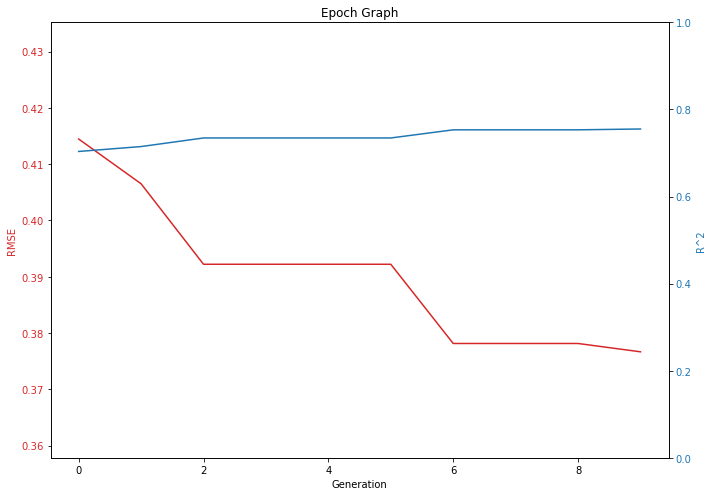

In [38]:
mt.Draw_epoch()

#### Model Information and Save

In [39]:
model = mt.GetModel(select,model_algo,descriptor)

Path :/home/lab08/qsar/72
Index   File Name
   0    4-training_p_f_s.train
Enter .train file index to load : 0




In [40]:
model.train_plot()

Loading BokehJS ...

,AATSC0e,CrippenLogP,MATS1i,XLogP
Coef Value,0.200491,0.362261,0.294284,0.261675


In [41]:
model.k_fold()

sklearn R^2CV mean: 0.758545
sklearn Q^2CV mean: 0.743785
RMSE CV : 0.396622
Features set = ['AATSC0e', 'CrippenLogP', 'MATS1i', 'XLogP']


In [42]:
model.features_table()

,AATSC0e,CrippenLogP,MATS1i,XLogP,EP,Predict,Error
ID,,,,,,,
100-71-0,-1.108047,0.230241,-0.628010,0.278985,-0.87,-0.389171,-0.480829
1121-78-4,-0.072443,-0.212733,-0.136784,-0.547353,-0.88,-0.422323,-0.457677
18368-63-3,-0.376124,0.925445,-0.856053,0.659829,-0.48,0.031474,-0.511474
108-99-6,-1.056909,-0.411475,-0.846169,-0.452142,-0.99,-0.856323,-0.133677
109-06-8,-1.056909,0.140801,-0.846169,-0.018403,-1.01,-0.549293,-0.460707
...,...,...,...,...,...,...,...
553-26-4,-0.965355,0.830192,-0.664080,-1.002250,0.21,-0.493707,0.703707
16063-70-0,0.710767,1.908807,-1.216019,1.803537,0.34,0.783162,-0.443162
53233-89-9,1.325466,-1.154737,0.872643,0.842023,0.57,0.160069,0.409931


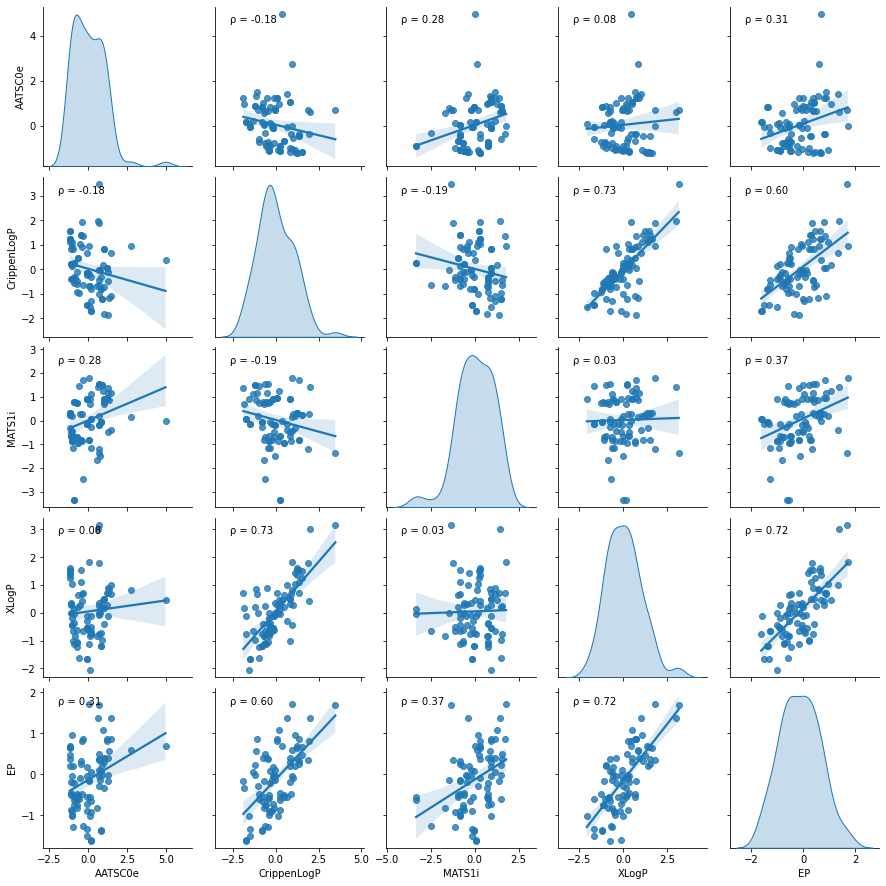

,AATSC0e,CrippenLogP,MATS1i,XLogP,EP
AATSC0e,1.000000,-0.184333,0.277169,0.082109,0.309131
CrippenLogP,-0.184333,1.000000,-0.193327,0.733776,0.601145
MATS1i,0.277169,-0.193327,1.000000,0.026375,0.374354
XLogP,0.082109,0.733776,0.026375,1.000000,0.720344
EP,0.309131,0.601145,0.374354,0.720344,1.000000


In [43]:
model.feature_corr()

In [44]:
model.save()

Path :/home/lab08/qsar/72
Index   File Name
   0    4-training_p_f_minmax.info
   1    4-training_p_f_standard.info
Enter .info file index to load : 1


Selected Algorithm in Feature Selection (MC/GA) : GA
Selected Model (MLR/PLS) : PLS
Enter model name to  save as
(default) 4-training_p_f_s_GA_PLS.model
- : 
4-training_p_f_s_GA_PLS.model file saved


Path :/home/lab08/qsar/72
Index   File Name
   0    4-training_p.sdf
Enter .sdf file index to load : 0




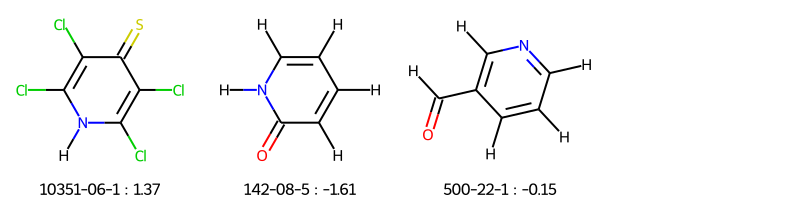

In [98]:
mol = draw_mol.DrawMols(ID=['10351-06-1','142-08-5','500-22-1'])
mol.show()

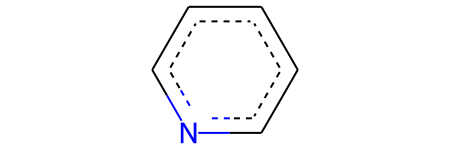

In [57]:
substr = mol.common_substr()
mol.show_substr(substr)

In [58]:
mol.show_3D()

interactive(children=(Dropdown(description='ID', options=('10351-06-1', '142-08-5', '500-22-1'), value='10351-…

## Model Information
-----------------------------------------------

#### ModelTest(test=True, scaled=True)
    * Model Test Part
    * If test is True, then show test R2, RMSE, and train/test plot
    * if test if False, Just show abut Train
    
    * Scaled False means test data is external, (not from split module) so if scaled=False, scale the test data by scale_obj above stetp

In [45]:
ModelTest = mt.ModelTest()

Path :/home/lab08/qsar/72
Index   File Name
   0    4-training_p_f_s_GA_PLS.model
   1    4-training_p_f_s_MC_MLR.model
Enter .model file index to load : 1




,GATS6e,SM1_Dzm,SRW8,nHBAcc,Description
Row,,,,,
Scale,0.734393,9.031375,0.302949,11.142157,Per feature relative scaling of the data to ac...
Mean,1.334926,17.125303,5.612008,13.179140,The mean value for each feature in the trainin...
Var,0.539333,81.565725,0.091778,124.147653,The variance for each feature in the training set
Coef,0.063173,0.256654,0.434983,-0.228179,Coef value of each feature
Padel Index,304.000000,350.000000,853.000000,690.000000,PaDEL descriptor index


,GATS6e,SM1_Dzm,SRW8,nHBAcc,EP,Predict,Error
ID,,,,,,,
100-71-0,-0.607197,-0.939707,-0.913614,-1.073253,-0.87,-0.592839,-0.277161
1121-78-4,3.179189,-0.567016,-0.520255,0.275565,-0.88,-0.394659,-0.485341
18368-63-3,-0.743358,0.048867,-0.498059,-1.073253,-0.48,-0.166960,-0.313040
108-99-6,-0.743358,-0.939707,-1.347037,-1.073253,-0.99,-0.789973,-0.200027
109-06-8,-0.743358,-0.939707,-1.347037,-1.073253,-1.01,-0.789973,-0.220027
...,...,...,...,...,...,...,...
553-26-4,0.544854,-0.726647,1.082284,0.275565,0.21,0.095030,0.114970
16063-70-0,-0.743358,2.026017,0.277356,-1.073253,0.34,0.677776,-0.337776
53233-89-9,-0.743358,0.794249,0.277356,1.624383,0.57,-0.253905,0.823905


,Value
Row,
R2_CV,0.7167174013977764
Q2_CV,0.6935370096675444
RMSE_CV,0.42353729850746097
Model_Algo,MLR
Preprocessing,standard


In [46]:
ModelTest.model_test(scaled=True)

Path :/home/lab08/qsar/72
Index   File Name
   0    4-training_p_f_s.test
Enter .test file index to load : 0




Test R2 : 0.331127
Test RMSE : 0.407140


In [48]:
ModelTest.editor()

Column(sizing_mode='stretch_width')
    [0] Row(sizing_mode='stretch_width')
        [0] JSMEEditor(format='smiles', height=500, sizing_mode='stretch_width')
        [1] Column(sizing_mode='stretch_width')
            [0] Param(JSMEEditor, parameters=['value'], sizing_mode='stretch_width', widgets={'value': {'type': <class ...})
            [1] Checkbox(name='New File?', sizing_mode='stretch_width', value=True)
            [2] TextAreaInput(height=30, placeholder='Enter File Name; F..., sizing_mode='fixed', width=400)
            [3] TextAreaInput(height=320, sizing_mode='fixed', value='Ready', width=400)
    [1] Button(button_type='primary', name='Evaluation', sizing_mode='stretch_width')

In [49]:
ModelTest.new_molecule('asdf.csv')